# **CycleGAN**

## Imports

In [ ]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image, ImageShow
import os
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.utils import save_image

## Model Implementation
For model implementation, we implement two classes:
1. Discriminator: For detecting real or fakeness of patches in picture using `PatchGAN`
2. Generator: We use `Encoding` convolutional layers, `Decoding` convolutional layers and `Residual blocks` at middle for generating new data.

### Discriminator
In discrimatior, we have some convolutional layers that each of them follows by one normalization and one LeakyRelu activation function. (Except first one)


In [ ]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()

    filters_number = [3, 64, 128, 256, 512, 1]
    filters_size = [4, 4, 4, 4, 4]
    strides = [2, 2, 2, 1, 1]
    self.layers = nn.ModuleList()
    layers_num = 5

    for i in range(layers_num):
      if i == 0:
        self.layers.append(nn.Conv2d(filters_number[i], filters_number[i+1], kernel_size=filters_size[i], stride=strides[i], padding=1, padding_mode="reflect"))
      else:
        self.layers.append(nn.Conv2d(filters_number[i], filters_number[i+1], kernel_size=filters_size[i], stride=strides[i], padding=1, bias=True, padding_mode="reflect"))
        self.layers.append(nn.InstanceNorm2d(filters_number[i+1]))
      self.layers.append(nn.LeakyReLU(0.2, inplace=True))
    
  def forward(self, input):
    out = input
    # print(out.shape)
    # print(len(self.layers))
    for layer in self.layers:
      out = layer(out)
      # print(out.shape)
    return out

### Generator
Generator is divided into three parts.
The first part is Encoder, which consists of 3 layers of convolution. The exact specifications of these layers include the number of neurons, filter size, stride and padding of each layer are in the code.
The second part is Residual, which consists of a number of Residual-blocks. Each of these blocks consists of two layers of convolution, normalization layers, RelU activation function, and so on.
The third part is Decoder, which does the opposite of the first part and uses ConvTranspose instead of convolution layers.

In [ ]:
class Generator(nn.Module):
  def __init__(self, residual_blocks_num=9):
    super(Generator, self).__init__()

    ## Encoder Part
    encoder_filters_number = [3, 64, 128, 256]
    encoder_filters_size = [7, 3, 3]
    encoder_strides = [1, 2, 2]
    encoder_paddings = [3, 1, 1]
    self.encoder_layers = nn.ModuleList()
    encoder_layers_num = 3

    for i in range(encoder_layers_num):
      self.encoder_layers.append(nn.Conv2d(encoder_filters_number[i], encoder_filters_number[i+1],
                                           kernel_size=encoder_filters_size[i], stride=encoder_strides[i], padding=encoder_paddings[i], padding_mode="reflect"))
      self.encoder_layers.append(nn.InstanceNorm2d(encoder_filters_number[i+1]))
      self.encoder_layers.append(nn.ReLU(inplace=True))

    ## Decoder Part
    decoder_filters_number = [256, 128, 64, 3]
    decoder_filters_size = [3, 3, 7]
    decoder_strides = [2, 2, 1]
    decoder_paddings = [1, 1, 3]
    self.decoder_layers = nn.ModuleList()
    decoder_layers_num = 3

    for i in range(decoder_layers_num-1):
      self.decoder_layers.append(nn.ConvTranspose2d(decoder_filters_number[i], decoder_filters_number[i+1],
                                           kernel_size=decoder_filters_size[i], stride=decoder_strides[i],
                                           padding=decoder_paddings[i], output_padding=1))
      self.decoder_layers.append(nn.InstanceNorm2d(decoder_filters_number[i+1]))
      self.decoder_layers.append(nn.ReLU(inplace=True))
    self.decoder_layers.append(nn.Conv2d(decoder_filters_number[decoder_layers_num-1], decoder_filters_number[decoder_layers_num],
                                           kernel_size=decoder_filters_size[decoder_layers_num-1], stride=decoder_strides[decoder_layers_num-1],
                                           padding=decoder_paddings[decoder_layers_num-1], padding_mode="reflect"))
    
    ## Residual Part
    self.residual_layers = nn.ModuleList()
    for i in range(residual_blocks_num):
      residual_block = nn.ModuleList()
      residual_block.append(nn.Conv2d(256, 256, kernel_size=3, padding=1, padding_mode="reflect"))
      residual_block.append(nn.InstanceNorm2d(256))
      residual_block.append(nn.ReLU(inplace=True))
      residual_block.append(nn.Conv2d(256, 256, kernel_size=3, padding=1, padding_mode="reflect"))
      residual_block.append(nn.InstanceNorm2d(256))
      residual_block.append(nn.Identity())
      self.residual_layers.append(residual_block)

  def encode(self, input):
    out = input 
    for layer in self.encoder_layers:
      out = layer(out)
    return out
  
  def residual(self, input):
    out = input 
    block_inp = input
    for residual_block in self.residual_layers:
      for layer in residual_block:
        out = layer(out)
      out = out + block_inp
      block_inp = out
    return out

  def decode(self, input):
    out = input 
    for layer in self.decoder_layers:
      out = layer(out)
    return out
    
  def forward(self, input):
    out = self.encode(input)
    out = self.residual(out)
    out = self.decode(out)
    return torch.tanh(out)

## Prepare Data

Download the data and then change the name of the folders containing the data for readability.
Due to the high volume of data and preventing the simultaneous loading of all of them in memory, we write our own dataset that gives us a photo record and a monet record each time and performs the necessary conversions on them.

In [ ]:
!git clone https://github.com/giddyyupp/ganilla.git

Cloning into 'ganilla'...
remote: Enumerating objects: 294, done.
remote: Total 294 (delta 0), reused 0 (delta 0), pack-reused 294
Receiving objects: 100% (294/294), 10.83 MiB | 39.75 MiB/s, done.
Resolving deltas: 100% (135/135), done.


In [ ]:
cd ganilla

/content/ganilla


In [ ]:
!bash ./datasets/download_cyclegan_dataset.sh monet2photo

Streaming output truncated to the last 5000 lines.
  inflating: ./datasets/monet2photo/trainB/2016-03-31 05:58:36.jpg  
  inflating: ./datasets/monet2photo/trainB/2014-01-10 12:46:39.jpg  
  inflating: ./datasets/monet2photo/trainB/2015-02-23 11:45:00.jpg  
  inflating: ./datasets/monet2photo/trainB/2015-05-23 09:38:08.jpg  
  inflating: ./datasets/monet2photo/trainB/2016-01-15 00:48:49.jpg  
  inflating: ./datasets/monet2photo/trainB/2016-12-27 18:15:26.jpg  
  inflating: ./datasets/monet2photo/trainB/2017-01-02 11:16:05.jpg  
  inflating: ./datasets/monet2photo/trainB/2015-08-06 11:08:32.jpg  
  inflating: ./datasets/monet2photo/trainB/2015-12-16 07:43:36.jpg  
  inflating: ./datasets/monet2photo/trainB/2016-03-25 12:57:28.jpg  
  inflating: ./datasets/monet2photo/trainB/2016-05-10 11:44:44.jpg  
  inflating: ./datasets/monet2photo/trainB/2015-03-11 08:01:52.jpg  
  inflating: ./datasets/monet2photo/trainB/2015-08-30 05:26:05.jpg  
  inflating: ./datasets/monet2photo/trainB/2015-10-0

In [ ]:
monet2photo_dir = '/content/ganilla/datasets/monet2photo'
os.rename('/content/ganilla/datasets/monet2photo/testA','/content/ganilla/datasets/monet2photo/test_monet')
os.rename('/content/ganilla/datasets/monet2photo/testB','/content/ganilla/datasets/monet2photo/test_photo')
os.rename('/content/ganilla/datasets/monet2photo/trainA','/content/ganilla/datasets/monet2photo/train_monet')
os.rename('/content/ganilla/datasets/monet2photo/trainB','/content/ganilla/datasets/monet2photo/train_photo')

In [ ]:
!pip install albumentations==0.4.6

     |████████████████████████████████| 117 kB 7.4 MB/s 
     |████████████████████████████████| 948 kB 12.0 MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.6-py3-none-any.whl size=65173 sha256=b7bb3451b4b124a7084417d18c0e89a86e63de1964fc2d140c1361c61fac9f37
  Stored in directory: /root/.cache/pip/wheels/cf/34/0f/cb2a5f93561a181a4bcc84847ad6aaceea8b5a3127469616cc
Successfully built albumentations
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

class Monet2PhotoDataset(Dataset):
  def __init__(self, monets_path, photos_path):
    self.monets_path = monets_path
    self.photos_path = photos_path

    self.monets = os.listdir(monets_path)
    self.photos = os.listdir(photos_path)
    
    self.monets_len = len(self.monets)
    self.photos_len = len(self.photos)

    self.transforms = A.Compose(
    [
      A.Resize(width=256, height=256),
      A.HorizontalFlip(p=0.5),
      A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
      ToTensorV2(),
    ],
  additional_targets={"image0": "image"},)

  def __len__(self):
    return min(max(self.monets_len, self.photos_len), 4000)

  def __getitem__(self, index):
    monet_path = os.path.join(self.monets_path, self.monets[index % self.monets_len])
    photo_path = os.path.join(self.photos_path, self.photos[index % self.photos_len])

    monet = np.array(Image.open(monet_path).convert("RGB"))
    photo = np.array(Image.open(photo_path).convert("RGB"))

    augmentations = self.transforms(image=monet, image0=photo)
    monet = augmentations["image"]
    photo = augmentations["image0"]
    return monet, photo

## Train and Test

To train the network, we do the following steps in each epoch:
We get a photo and a monet  from the dataset.
Now for Discriminator training, first we give a real photo sample to discriminator and calcualate loss with all ones matrix,  then we give a real photo sample to Generator and give the generated photo to discriminator, and calcualate loss with all zeroes matrix. We do all the previous steps for monet as well. Finally, the value of Discriminator loss is equal to one-half of the sum of the two loss's.
For Generator training We need to calculate three types of errors. The first is Adversarial loss. to see how much generator generates similar real data. We calculate this error for both the conversion of photo to monet and monet to photo conversion.
The second is to make sure of the network performance cycle, and the third is to check whether the generator can change the direction of what it should and should not.
  
We store the generated data in steps of a multiple of 100 and take it as the output of the training function with the values of loss.


In [ ]:
def train(train_loader, G_monet2photo, D_monet2photo, G_photo2monet, D_photo2monet, D_opt, G_opt, epochs_num):
  MSE = nn.MSELoss()
  L1 = nn.L1Loss()
  G_scaler = torch.cuda.amp.GradScaler()
  D_scaler = torch.cuda.amp.GradScaler()
  monets = [[] for i in range(epochs_num)]
  photos = [[] for i in range(epochs_num)]
  all_train_loss = {'G':[], 'D':[]}

  for i, epoch in tqdm(enumerate(range(1, epochs_num+1))):
    epoch_D_loss = 0
    epoch_G_loss = 0
    record_num = 0
    for index, data in enumerate(train_loader):
      # print('index = {}'.format(index))
      monet, photo = data
      monet, photo = monet.cuda(), photo.cuda()
      # Train D
      with torch.cuda.amp.autocast():
        # Photo to Monet
        generated_monet = G_photo2monet(photo)
        real_monet_D =  D_photo2monet(monet)
        generated_monet_D =  D_photo2monet(generated_monet.detach())
        real_monet_D_loss = MSE(real_monet_D, torch.ones_like(real_monet_D))
        generated_monet_D_loss = MSE(generated_monet_D, torch.zeros_like(generated_monet_D))
        monet_loss_D = real_monet_D_loss + generated_monet_D_loss
        
        # Monet to Photo
        generated_photo = G_monet2photo(monet)
        real_photo_D =  D_monet2photo(photo)
        generated_photo_D =  D_monet2photo(generated_photo.detach())
        real_photo_D_loss = MSE(real_photo_D, torch.ones_like(real_photo_D))
        generated_photo_D_loss = MSE(generated_photo_D, torch.zeros_like(generated_photo_D))
        photo_loss_D = real_photo_D_loss + generated_photo_D_loss

        loss_D = 0.5*(monet_loss_D + photo_loss_D)

      D_opt.zero_grad()
      D_scaler.scale(loss_D).backward()
      # retain_graph=True
      D_scaler.step(D_opt)
      D_scaler.update()

      # Train G
      with torch.cuda.amp.autocast():
        # Adversarial Loss
        generated_monet_D =  D_photo2monet(generated_monet)
        adversarial_monet_loss = MSE(generated_monet_D, torch.ones_like(generated_monet_D))

        generated_photo_D =  D_monet2photo(generated_photo)
        adversarial_photo_loss = MSE(generated_photo_D, torch.ones_like(generated_photo_D))

        # Cycle Consistency Loss
        cycle_monet = G_photo2monet(generated_photo)
        cycle_monet_loss = L1(monet, cycle_monet)

        cycle_photo = G_monet2photo(generated_monet)
        cycle_photo_loss = L1(photo, cycle_photo)

        # Identity Loss
        identity_monet = G_photo2monet(monet)
        identity_monet_loss = L1(monet, identity_monet)

        identity_photo = G_monet2photo(photo)
        identity_photo_loss = L1(photo, identity_photo)

        loss_G = adversarial_monet_loss + adversarial_photo_loss + cycle_monet_loss*10 + cycle_photo_loss*10 + \
                  identity_monet_loss + identity_photo_loss

      G_opt.zero_grad()
      G_scaler.scale(loss_G).backward()
      G_scaler.step(G_opt)
      G_scaler.update()

      record_num += 1
      epoch_G_loss += loss_G.item()
      epoch_D_loss += loss_D.item()

      if index % 100 == 0:
        print('index = {}'.format(index))
        monets[epoch-1].append(generated_monet*0.5+0.5)
        photos[epoch-1].append(generated_photo*0.5+0.5)
      
    all_train_loss['G'].append(epoch_G_loss/record_num)
    all_train_loss['D'].append(epoch_D_loss/record_num)
  return monets, photos, all_train_loss
      

## Run Model
Dor running model, at first, we empty cache and call garbage collector because we have very small memory and in this network, we want high memory for training. 

After that, we make our train loaders and define discriminators and generators and their optimizers.

After that, we train our model.

In [ ]:
torch.cuda.empty_cache()

In [ ]:
import gc
del G_monet2photo, D_monet2photo, G_photo2monet, D_photo2monet
gc.collect()

176

In [ ]:
train_set = Monet2PhotoDataset('/content/ganilla/datasets/monet2photo/train_monet', '/content/ganilla/datasets/monet2photo/train_photo')
test_set = Monet2PhotoDataset('/content/ganilla/datasets/monet2photo/test_monet', '/content/ganilla/datasets/monet2photo/test_photo')

In [ ]:
train_loader = DataLoader(train_set, batch_size=1, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_set, batch_size=1, shuffle=True, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
G_monet2photo = Generator().cuda()
D_monet2photo = Discriminator().cuda()

In [ ]:
G_photo2monet = Generator().cuda()
D_photo2monet = Discriminator().cuda()

In [ ]:
D_opt = optim.Adam(list(D_monet2photo.parameters()) + list(D_photo2monet.parameters()), lr=1e-5, betas=(0.5, 0.999))
G_opt = optim.Adam(list(G_monet2photo.parameters()) + list(G_photo2monet.parameters()), lr=1e-5, betas=(0.5, 0.999))

In [ ]:
monets, photos, all_train_loss = train(train_loader, G_monet2photo, D_monet2photo, G_photo2monet, D_photo2monet, D_opt, G_opt, 2)

0it [00:00, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


index = 0
index = 100
index = 200
index = 300
index = 400
index = 500
index = 600
index = 700
index = 800
index = 900
index = 1000
index = 1100
index = 1200
index = 1300
index = 1400
index = 1500
index = 1600
index = 1700
index = 1800
index = 1900
index = 2000
index = 2100
index = 2200
index = 2300
index = 2400
index = 2500
index = 2600
index = 2700
index = 2800
index = 2900
index = 3000
index = 3100
index = 3200
index = 3300
index = 3400
index = 3500
index = 3600
index = 3700
index = 3800
index = 3900


1it [32:25, 1945.89s/it]

index = 0
index = 100
index = 200
index = 300
index = 400
index = 500
index = 600
index = 700
index = 800
index = 900
index = 1000
index = 1100
index = 1200
index = 1300
index = 1400
index = 1500
index = 1600
index = 1700
index = 1800
index = 1900
index = 2000
index = 2100
index = 2200
index = 2300
index = 2400
index = 2500
index = 2600
index = 2700
index = 2800
index = 2900
index = 3000
index = 3100
index = 3200
index = 3300
index = 3400
index = 3500
index = 3600
index = 3700
index = 3800
index = 3900


2it [1:04:52, 1946.11s/it]


In [ ]:
def plot_result(epochs_train, epochs_num, title):
  x_axis = range(1, epochs_num+1)
  legends = ['G', 'D']
  x_label = 'Epoch'
  plt.plot(x_axis, epochs_train['G'])
  plt.plot(x_axis, epochs_train['D'])
  plt.title(title)
  plt.xlabel(x_label)
  plt.legend(legends)
  plt.show()

Plot loss in 2 epochs... it's reducing :D

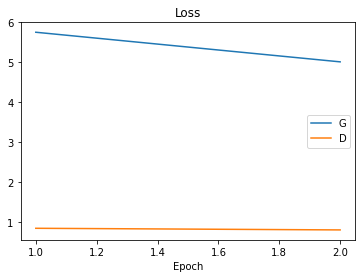

{'G': [5.753929816961288, 5.012006928682327], 'D': [0.8415226840376854, 0.8006938759982586]}


In [ ]:
plot_result(all_train_loss, 2, 'Loss')
print(all_train_loss)

Function for saving result...

In [ ]:
def save_result(images, type):
  columxns = 3
  rows = 20
  fig = plt.figure(figsize=(15, 100))
  for i, image_epoch in enumerate(images):
    for j, image in enumerate(image_epoch):
      fig.add_subplot(rows, columxns, i+j+1)
      save_image(image, "{}_{}_{}.png".format(type, i, j))
      img = Image.open("{}_{}_{}.png".format(type, i, j))
      # x = image.cpu().data.numpy()
      plt.imshow(img)
      plt.axis('off')

Save monets from output of model

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


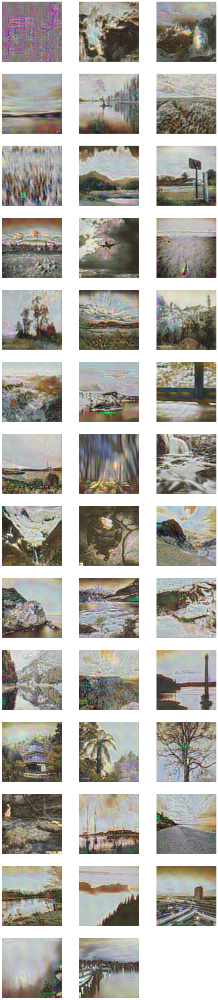

In [ ]:
save_result(monets, 'monet')

Save photos from output of model

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


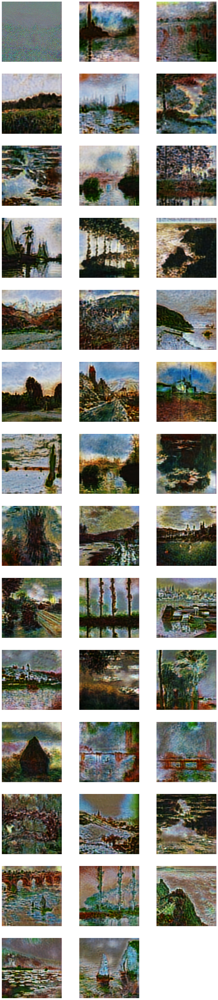

In [ ]:
save_result(photos, 'photo')